# Dijkstra Algorithm

In [12]:
from IPython.display import Image

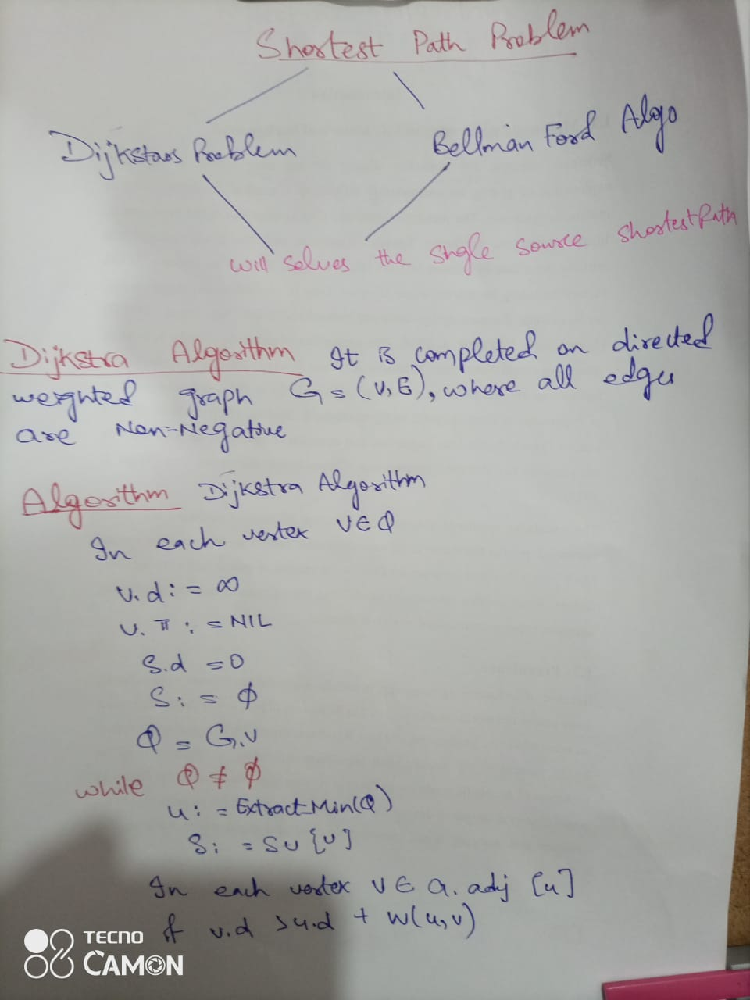

In [4]:
Image('dj2.jpeg')

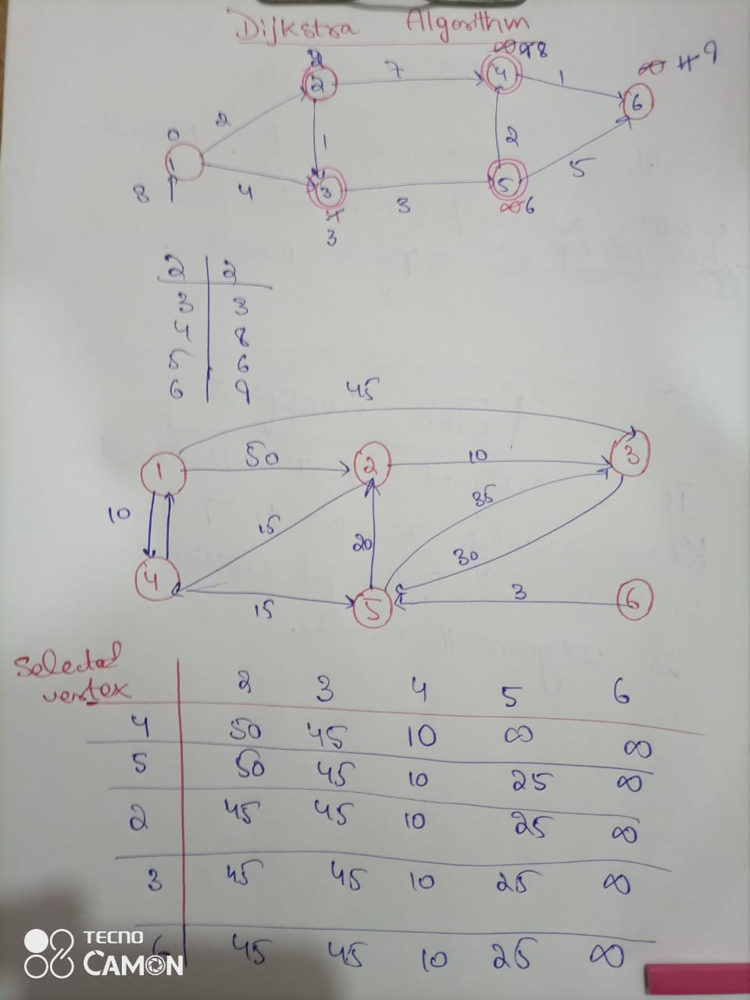

In [5]:
Image('dj1.jpeg')

In [22]:

class Graph:
    def __init__(self):
        self.vertDictionary = {}
        self.numVertices = 0

    def __iter__(self):
        return iter(self.vertDictionary.values())

    def addVertex(self, node):
        self.numVertices = self.numVertices + 1
        newVertex = Vertex(node)
        self.vertDictionary[node] = newVertex
        return newVertex

    def getVertex(self, n):
        if n in self.vertDictionary:
            return self.vertDictionary[n]
        else:
            return None

    def addEdge(self, frm, to, cost=0):
        if frm not in self.vertDictionary:
            self.addVertex(frm)
        if to not in self.vertDictionary:
            self.addVertex(to)

        self.vertDictionary[frm].addNeighbor(self.vertDictionary[to], cost)
        self.vertDictionary[to].addNeighbor(self.vertDictionary[frm], cost)

    def getVertices(self):
        return self.vertDictionary.keys()

    def setPrevious(self, current):
        self.previous = current

    def getPrevious(self, current):
        return self.previous

def shortest(v, path):
    ''' make shortest path from v.previous'''
    if v.previous:
        path.append(v.previous.getVertexID())
        shortest(v.previous, path)
    return

import heapq


def dijkstra(G, source, destination):
    print('''Dijkstra's shortest path''')
    # Set the distance for the source node to zero 
    source.setDistance(0)

    # Put tuple pair into the priority queue
    unvisitedQueue = [(v.getDistance(), v) for v in G]
    heapq.heapify(unvisitedQueue)
    
    while len(unvisitedQueue):
        uv = heapq.heappop(unvisitedQueue)
        current = uv[1]
        current.setVisited()
        
        for next in current.adjacent:
            if next.visited:
                continue
                
            newDist = current.getDistance() + current.getWeight(next)
            
            
            if newDist < next.getDistance():
                next.setDistance(newDist)
                next.setPrevious(current)
                print('Updated : current = %s next = %s newDist = %s' \
                        % (current.getVertexID(), next.getVertexID(), next.getDistance()))
                
            else:
                print('Not updated : current = %s next = %s newDist = %s' \
                        % (current.getVertexID(), next.getVertexID(), next.getDistance()))
                
        while len(unvisitedQueue):
            heapq.heappop(unvisitedQueue)
        # 2. Put all vertices not visited into the queue
        unvisitedQueue = [(v.getDistance(), v) for v in G if not v.visited]
        heapq.heapify(unvisitedQueue)    
                
        


In [29]:
G = Graph()
G.addVertex('a')
G.addVertex('b')
G.addVertex('c')
G.addVertex('d')
G.addVertex('e')
G.addEdge('a','b',4)
G.addEdge('a','c',1)
G.addEdge('c','b',2)
G.addEdge('b','e',4)
G.addEdge('c','d',4)
G.addEdge('d','e',4)

In [28]:
import sys

class Vertex:
    def __init__(self, node):
        self.id = node
        self.adjacent = {}
        # Set distance to infinity for all nodes
        self.distance = sys.maxsize
        # Mark all nodes unvisited        
        self.visited = False  
        # Predecessor
        self.previous = None

    def addNeighbor(self, neighbor, weight=0):
        self.adjacent[neighbor] = weight

    def getConnections(self):
        return self.adjacent.keys()  

    def getVertexID(self):
        return self.id

    def getWeight(self, neighbor):
        return self.adjacent[neighbor]

    def setDistance(self, dist):
        self.distance = dist

    def getDistance(self):
        return self.distance

    def setPrevious(self, prev):
        self.previous = prev

    def setVisited(self):
        self.visited = True

    def __str__(self):
        return str(self.id) + ' adjacent: ' + str([x.id for x in self.adjacent])

class Graph:
    def __init__(self):
        self.vertDictionary = {}
        self.numVertices = 0

    def __iter__(self):
        return iter(self.vertDictionary.values())

    def addVertex(self, node):
        self.numVertices = self.numVertices + 1
        newVertex = Vertex(node)
        self.vertDictionary[node] = newVertex
        return newVertex

    def getVertex(self, n):
        if n in self.vertDictionary:
            return self.vertDictionary[n]
        else:
            return None

    def addEdge(self, frm, to, cost=0):
        if frm not in self.vertDictionary:
            self.addVertex(frm)
        if to not in self.vertDictionary:
            self.addVertex(to)

        self.vertDictionary[frm].addNeighbor(self.vertDictionary[to], cost)
        self.vertDictionary[to].addNeighbor(self.vertDictionary[frm], cost)

    def getVertices(self):
        return self.vertDictionary.keys()

    def setPrevious(self, current):
        self.previous = current

    def getPrevious(self, current):
        return self.previous

def shortest(v, path):
    ''' make shortest path from v.previous'''
    if v.previous:
        path.append(v.previous.getVertexID())
        shortest(v.previous, path)
    return

import heapq

def dijkstra(G, source, destination):
    print('''Dijkstra's shortest path''')
    # Set the distance for the source node to zero 
    source.setDistance(0)

    # Put tuple pair into the priority queue
    unvisitedQueue = [(v.getDistance(), v) for v in G]
    heapq.heapify(unvisitedQueue)

    while len(unvisitedQueue):
        # Pops a vertex with the smallest distance 
        uv = heapq.heappop(unvisitedQueue)
        current = uv[1]
        current.setVisited()

        # for next in v.adjacent:
        for next in current.adjacent:
            # if visited, skip
            if next.visited:
                continue
            newDist = current.getDistance() + current.getWeight(next)
            
            if newDist < next.getDistance():
                next.setDistance(newDist)
                next.setPrevious(current)
                print('Updated : current = %s next = %s newDist = %s' \
                        % (current.getVertexID(), next.getVertexID(), next.getDistance()))
            else:
                print('Not updated : current = %s next = %s newDist = %s' \
                        % (current.getVertexID(), next.getVertexID(), next.getDistance()))

        while len(unvisitedQueue):
            heapq.heappop(unvisitedQueue)
        # 2. Put all vertices not visited into the queue
        unvisitedQueue = [(v.getDistance(), v) for v in G if not v.visited]
        heapq.heapify(unvisitedQueue)

In [5]:
import sys

class Vertex:
    def __init__(self, node):
        self.id = node
        self.adjacent = {}
        # Set distance to infinity for all nodes
        self.distance = sys.maxsize
        # Mark all nodes unvisited        
        self.visited = False  
        # Predecessor
        self.previous = None

    def addNeighbor(self, neighbor, weight=0):
        self.adjacent[neighbor] = weight

    def getConnections(self):
        return self.adjacent.keys()  

    def getVertexID(self):
        return self.id

    def getWeight(self, neighbor):
        return self.adjacent[neighbor]

    def setDistance(self, dist):
        self.distance = dist

    def getDistance(self):
        return self.distance

    def setPrevious(self, prev):
        self.previous = prev

    def setVisited(self):
        self.visited = True

    def __str__(self):
        return str(self.id) + ' adjacent: ' + str([x.id for x in self.adjacent])

class Graph:
    def __init__(self):
        self.vertDictionary = {}
        self.numVertices = 0

    def __iter__(self):
        return iter(self.vertDictionary.values())

    def addVertex(self, node):
        self.numVertices = self.numVertices + 1
        newVertex = Vertex(node)
        self.vertDictionary[node] = newVertex
        return newVertex

    def getVertex(self, n):
        if n in self.vertDictionary:
            return self.vertDictionary[n]
        else:
            return None

    def addEdge(self, frm, to, cost=0):
        if frm not in self.vertDictionary:
            self.addVertex(frm)
        if to not in self.vertDictionary:
            self.addVertex(to)

        self.vertDictionary[frm].addNeighbor(self.vertDictionary[to], cost)
        self.vertDictionary[to].addNeighbor(self.vertDictionary[frm], cost)

    def getVertices(self):
        return self.vertDictionary.keys()

    def setPrevious(self, current):
        self.previous = current

    def getPrevious(self, current):
        return self.previous

def shortest(v, path):
    ''' make shortest path from v.previous'''
    if v.previous:
        path.append(v.previous.getVertexID())
        shortest(v.previous, path)
    return

import heapq

In [6]:
def dijkstra(G, source):
    print('''Dijkstra's shortest path''')
    # Set the distance for the source node to zero 
    source.setDistance(0)

    # Put tuple pair into the priority queue
    unvisitedQueue = [(v.getDistance(), v) for v in G]
    heapq.heapify(unvisitedQueue)

    while len(unvisitedQueue):
        # Pops a vertex with the smallest distance 
        uv = heapq.heappop(unvisitedQueue)
        current = uv[1]
        current.setVisited()

        # for next in v.adjacent:
        for next in current.adjacent:
            # if visited, skip
            if next.visited:
                continue
            newDist = current.getDistance() + current.getWeight(next)
            
            if newDist < next.getDistance():
                next.setDistance(newDist)
                next.setPrevious(current)
                print('Updated : current = %s next = %s newDist = %s' \
                        % (current.getVertexID(), next.getVertexID(), next.getDistance()))
            else:
                print('Not updated : current = %s next = %s newDist = %s' \
                        % (current.getVertexID(), next.getVertexID(), next.getDistance()))

        # Rebuild heap
        # 1. Pop every item
        while len(unvisitedQueue):
            heapq.heappop(unvisitedQueue)
        # 2. Put all vertices not visited into the queue
        unvisitedQueue = [(v.getDistance(), v) for v in G if not v.visited]
        heapq.heapify(unvisitedQueue)

def allPairsShortestPathLength(G, cutoff=None):
    """ Return dictionary of shortest path lengths between all nodes in G."""
    paths = {}
    for n in G:
        paths[n] = dijkstra(G, n, cutoff=cutoff)
    return paths 	

In [7]:
G = Graph()
G.addVertex('a')
G.addVertex('b')
G.addVertex('c')
G.addVertex('d')
G.addVertex('e')
G.addEdge('a', 'b', 4)  
G.addEdge('a', 'c', 1)
G.addEdge('c', 'b', 2)
G.addEdge('b', 'e', 4)
G.addEdge('c', 'd', 4)
G.addEdge('d', 'e', 4)

In [8]:
print('Graph data:')
for v in G:
    for w in v.getConnections():
        vid = v.getVertexID()
        wid = w.getVertexID()
        print('( %s , %s, %3d)' % (vid, wid, v.getWeight(w)))

Graph data:
( a , b,   4)
( a , c,   1)
( b , a,   4)
( b , c,   2)
( b , e,   4)
( c , a,   1)
( c , b,   2)
( c , d,   4)
( d , c,   4)
( d , e,   4)
( e , b,   4)
( e , d,   4)


In [19]:
from collections import deque

INFINITY = float("inf")


class Graph:
    def __init__(self, filename):
        """Reads graph definition and stores it. Each line of the graph
        definition file defines an edge by specifying the start node,
        end node, and distance, delimited by spaces.
        Stores the graph definition in two properties which are used by
        Dijkstra's algorithm in the shortest_path method:
        self.nodes = set of all unique nodes in the graph
        self.adjacency_list = dict that maps each node to an unordered set of
        (neighbor, distance) tuples.
        """

        # Read the graph definition file and store in graph_edges as a list of
        # lists of [from_node, to_node, distance]. This data structure is not
        # used by Dijkstra's algorithm, it's just an intermediate step in the
        # create of self.nodes and self.adjacency_list.
        graph_edges = []
        with open(filename) as fhandle:
            for line in fhandle:
                edge_from, edge_to, cost, *_ = line.strip().split(" ")
                graph_edges.append((edge_from, edge_to, float(cost)))

        self.nodes = set()
        for edge in graph_edges:
            self.nodes.update([edge[0], edge[1]])

        self.adjacency_list = {node: set() for node in self.nodes}
        for edge in graph_edges:
            self.adjacency_list[edge[0]].add((edge[1], edge[2]))

    def shortest_path(self, start_node, end_node):
        """Uses Dijkstra's algorithm to determine the shortest path from
        start_node to end_node. Returns (path, distance).
        """

        unvisited_nodes = self.nodes.copy()  # All nodes are initially unvisited.

        # Create a dictionary of each node's distance from start_node. We will
        # update each node's distance whenever we find a shorter path.
        distance_from_start = {
            node: (0 if node == start_node else INFINITY) for node in self.nodes
        }

        # Initialize previous_node, the dictionary that maps each node to the
        # node it was visited from when the the shortest path to it was found.
        previous_node = {node: None for node in self.nodes}

        while unvisited_nodes:
            # Set current_node to the unvisited node with shortest distance
            # calculated so far.
            current_node = min(
                unvisited_nodes, key=lambda node: distance_from_start[node]
            )
            unvisited_nodes.remove(current_node)

            # If current_node's distance is INFINITY, the remaining unvisited
            # nodes are not connected to start_node, so we're done.
            if distance_from_start[current_node] == INFINITY:
                break

            # For each neighbor of current_node, check whether the total distance
            # to the neighbor via current_node is shorter than the distance we
            # currently have for that node. If it is, update the neighbor's values
            # for distance_from_start and previous_node.
            for neighbor, distance in self.adjacency_list[current_node]:
                new_path = distance_from_start[current_node] + distance
                if new_path < distance_from_start[neighbor]:
                    distance_from_start[neighbor] = new_path
                    previous_node[neighbor] = current_node

            if current_node == end_node:
                break # we've visited the destination node, so we're done

        # To build the path to be returned, we iterate through the nodes from
        # end_node back to start_node. Note the use of a deque, which can
        # appendleft with O(1) performance.
        path = deque()
        current_node = end_node
        while previous_node[current_node] is not None:
            path.appendleft(current_node)
            current_node = previous_node[current_node]
        path.appendleft(start_node)

        return path, distance_from_start[end_node]


def main():
    """Runs a few simple tests to verify the implementation.
    """
    verify_algorithm(
        filename="simple_graph.txt",
        start="A",
        end="G",
        path=["A", "D", "E", "G"],
        distance=11,
    )
    verify_algorithm(
        filename="seattle_area.txt",
        start="Renton",
        end="Redmond",
        path=["Renton", "Factoria", "Bellevue", "Northup", "Redmond"],
        distance=16,
    )
    verify_algorithm(
        filename="seattle_area.txt",
        start="Seattle",
        end="Redmond",
        path=["Seattle", "Eastlake", "Northup", "Redmond"],
        distance=15,
    )
    verify_algorithm(
        filename="seattle_area.txt",
        start="Eastlake",
        end="Issaquah",
        path=["Eastlake", "Seattle", "SoDo", "Factoria", "Issaquah"],
        distance=21,
    )


def verify_algorithm(filename, start, end, path, distance):
    """Helper function to run simple tests and print results to console.
    filename = graph definition file
    start/end = path to be calculated
    path = expected shorted path
    distance = expected distance of path
    """
    graph = Graph(filename)
    returned_path, returned_distance = graph.shortest_path(start, end)

    assert list(returned_path) == path
    assert returned_distance == distance

    print('\ngraph definition file: {0}'.format(filename))
    print('      start/end nodes: {0} -> {1}'.format(start, end))
    print('        shortest path: {0}'.format(path))
    print('       total distance: {0}'.format(distance))


In [20]:
main()


graph definition file: simple_graph.txt
      start/end nodes: A -> G
        shortest path: ['A', 'D', 'E', 'G']
       total distance: 11

graph definition file: seattle_area.txt
      start/end nodes: Renton -> Redmond
        shortest path: ['Renton', 'Factoria', 'Bellevue', 'Northup', 'Redmond']
       total distance: 16

graph definition file: seattle_area.txt
      start/end nodes: Seattle -> Redmond
        shortest path: ['Seattle', 'Eastlake', 'Northup', 'Redmond']
       total distance: 15

graph definition file: seattle_area.txt
      start/end nodes: Eastlake -> Issaquah
        shortest path: ['Eastlake', 'Seattle', 'SoDo', 'Factoria', 'Issaquah']
       total distance: 21


# Breadth First Search 

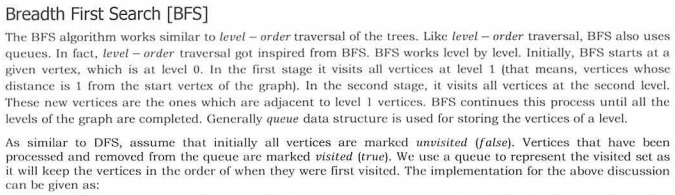

In [10]:
Image('bfs1.png')

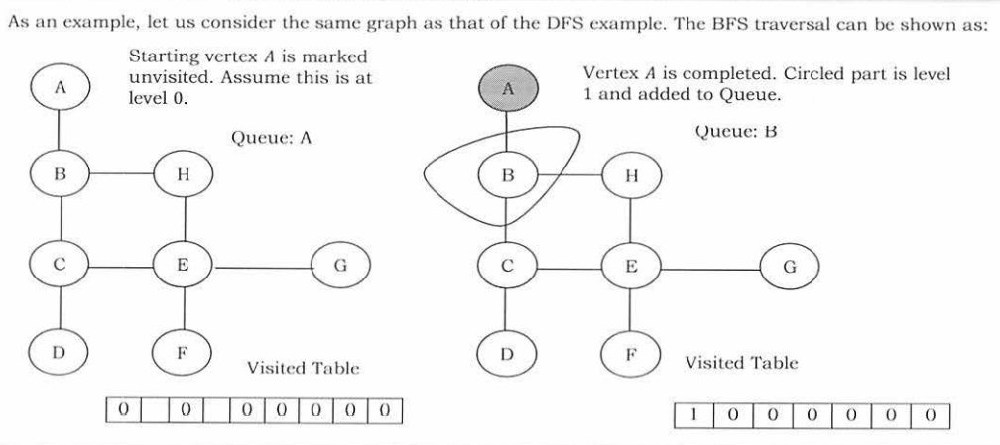

In [11]:
Image('bfs2.png')

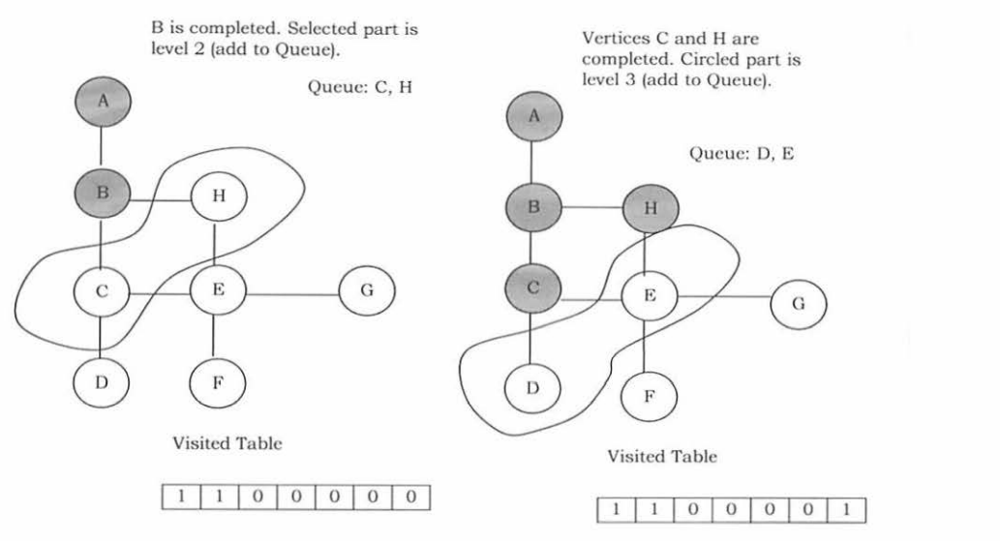

In [12]:
Image('bfs3.png')

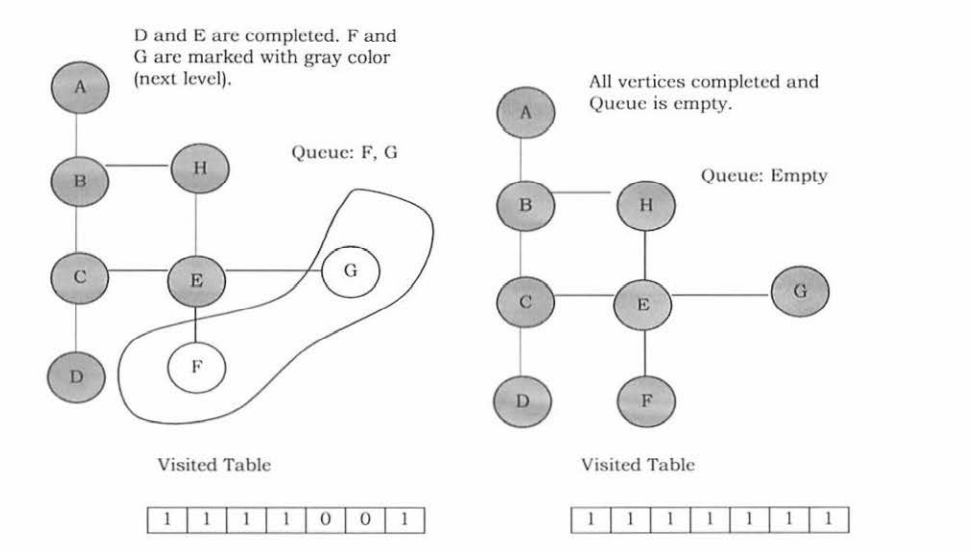

In [13]:
Image('bfs4.png')

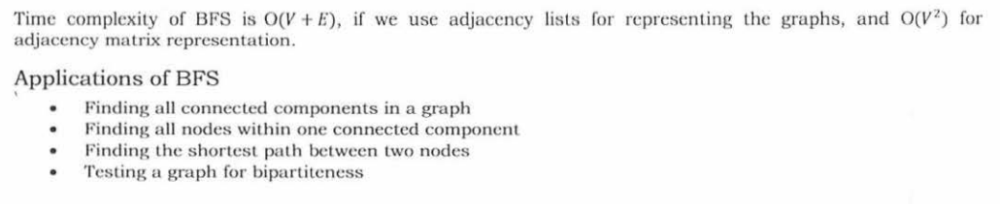

In [14]:
Image('bfs5.png')

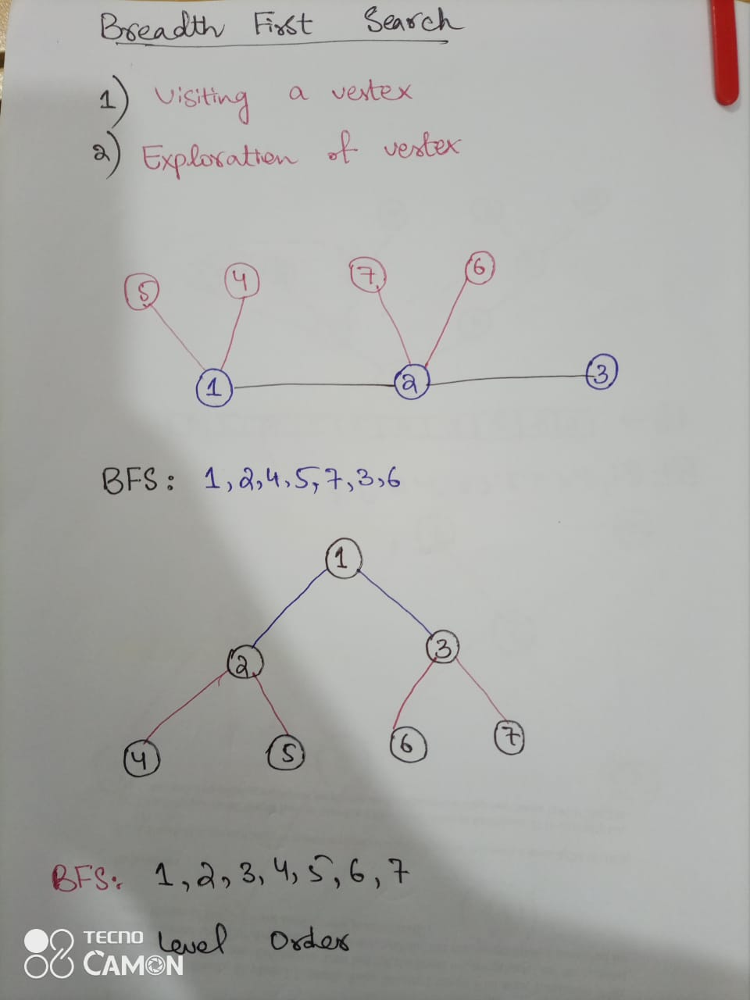

In [15]:
Image('bfs6.jpeg')

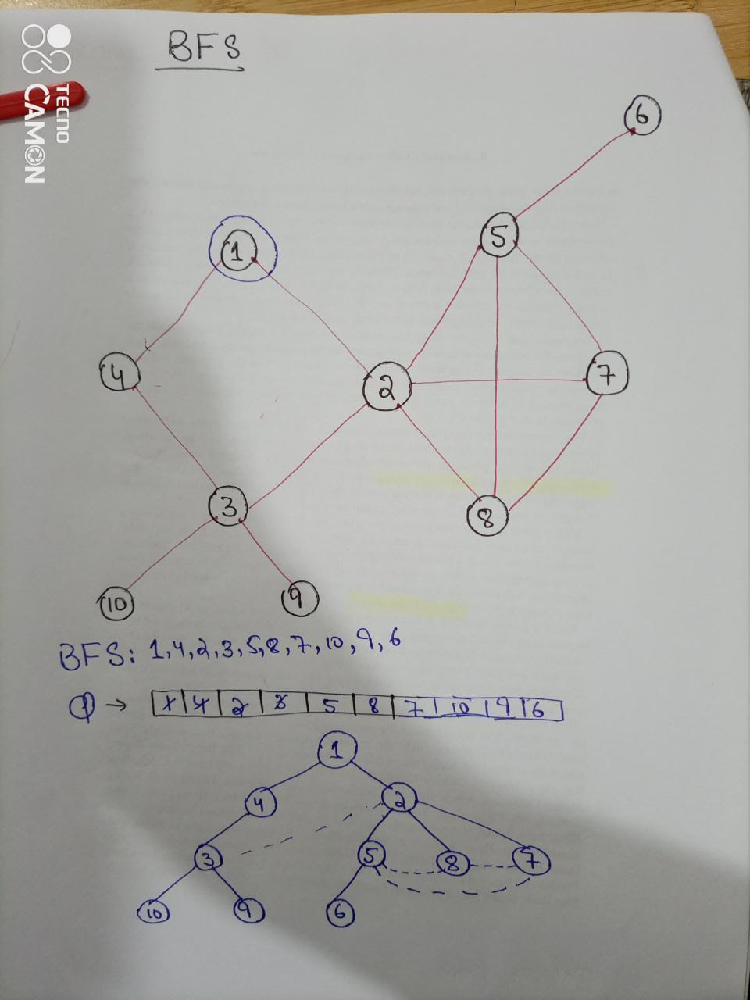

In [16]:
Image('bfs8.jpeg')

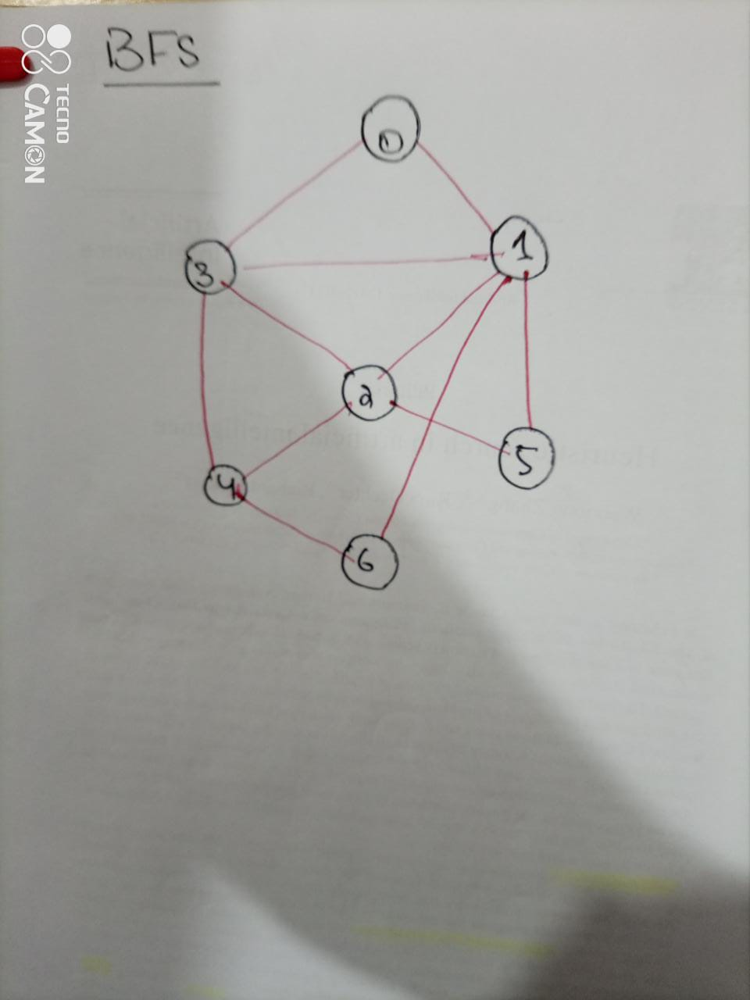

In [17]:
Image('bfs9.jpeg')

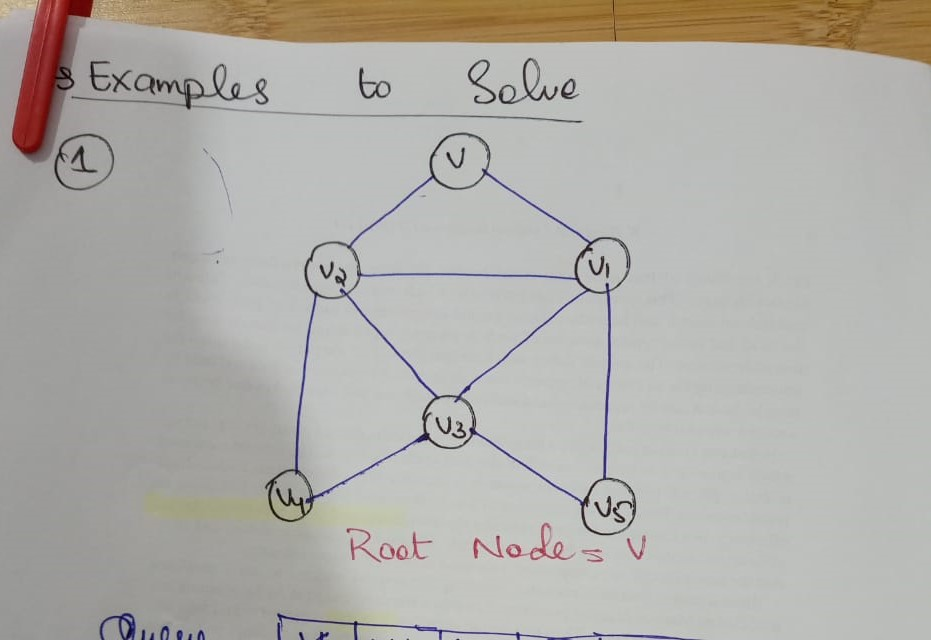

In [18]:
Image('bfs10.jpeg')

In [7]:
class Node:
	# constructor
	def __init__(self, data=None, next=None):
		self.data = data
		self.last = None
		self.next = next
	# method for setting the data field of the node    
	def set_data(self, data):
		self.data = data
	# method for getting the data field of the node   
	def get_data(self):
		return self.data
	# method for setting the next field of the node
	def set_next(self, next):
		self.next = next
	# method for getting the next field of the node    
	def get_next(self):
		return self.next
	# method for setting the last field of the node
	def setLast(self, last):
		self.last = last
	# method for getting the last field of the node    
	def getLast(self):
		return self.last	
	# returns true if the node points to another node
	def has_next(self):
		return self.next != None


class Queue(object):
	def __init__(self, data=None):
		self.front = None
		self.rear = None
		self.size = 0

	def enQueue(self, data):
		self.lastNode = self.front
		self.front = Node(data, self.front)
		if self.lastNode:
			self.lastNode.setLast(self.front)
		if self.rear is None:
			self.rear = self.front
		self.size += 1

	def queueRear(self):
		if self.rear is None:
			print("Sorry, the queue is empty!")
			raise IndexError
		return self.rear.get_data()

	def queueFront(self):
		if self.front is None:
			print("Sorry, the queue is empty!")
			raise IndexError
		return self.front.get_data()

	def deQueue(self):
		if self.rear is None:
			print("Sorry, the queue is empty!")
			raise IndexError
		result = self.rear.get_data()
		self.rear = self.rear.last
		self.size -= 1
		return result

	def size(self):
		return self.size
	
import sys
class Vertex:
    def __init__(self, node):
        self.id = node
        self.adjacent = {}
        # Set distance to infinity for all nodes
        self.distance = sys.maxsize
        # Mark all nodes unvisited        
        self.visited = False
        # Mark all nodes color with white        
        self.color = 'white'  	
        # Predecessor
        self.previous = None

    def addNeighbor(self, neighbor, weight=0):
        self.adjacent[neighbor] = weight

    def getConnections(self):
        return self.adjacent.keys()  

    def getVertexID(self):
        return self.id

    def getWeight(self, neighbor):
        return self.adjacent[neighbor]

    def setDistance(self, dist):
        self.distance = dist

    def getDistance(self):
        return self.distance
	
    def setColor(self, color):
        self.color = color

    def getColor(self):
        return self.color	

    def setPrevious(self, prev):
        self.previous = prev

    def setVisited(self):
        self.visited = True

    def __str__(self):
        return str(self.id) + ' adjacent: ' + str([x.id for x in self.adjacent])

class Graph:
    def __init__(self):
        self.vertDictionary = {}
        self.numVertices = 0

    def __iter__(self):
        return iter(self.vertDictionary.values())

    def addVertex(self, node):
        self.numVertices = self.numVertices + 1
        newVertex = Vertex(node)
        self.vertDictionary[node] = newVertex
        return newVertex

    def getVertex(self, n):
        if n in self.vertDictionary:
            return self.vertDictionary[n]
        else:
            return None

    def addEdge(self, frm, to, cost=0):
        if frm not in self.vertDictionary:
            self.addVertex(frm)
        if to not in self.vertDictionary:
            self.addVertex(to)

        self.vertDictionary[frm].addNeighbor(self.vertDictionary[to], cost)
	# For directed graph do not add this
        self.vertDictionary[to].addNeighbor(self.vertDictionary[frm], cost)

    def getVertices(self):
        return self.vertDictionary.keys()

    def setPrevious(self, current):
        self.previous = current

    def getPrevious(self, current):
        return self.previous
	
    def getEdges(self):
        edges = []
        for v in G:
            for w in v.getConnections():
                vid = v.getVertexID()
                wid = w.getVertexID()
                edges.append((vid, wid, v.getWeight(w)))
        return edges
 
def BFSTraversal(G, s):  
	start = G.getVertex(s)
	start.setDistance(0)
	start.setPrevious(None)
	vertQueue = Queue()
	vertQueue.enQueue(start)

	while (vertQueue.size > 0):
		currentVert = vertQueue.deQueue()
		print(currentVert.getVertexID())
		for nbr in currentVert.getConnections():
			if (nbr.getColor() == 'white'):
				nbr.setColor('gray')
				nbr.setDistance(currentVert.getDistance() + 1)
				nbr.setPrevious(currentVert)
				vertQueue.enQueue(nbr)
			currentVert.setColor('black')

In [8]:
def BFS(G):
	for v in G:
		if (v.getColor() == 'white'):
			BFSTraversal(G, v.getVertexID())

if __name__ == '__main__':

    G = Graph()
    G.addVertex('a')
    G.addVertex('b')
    G.addVertex('c')
    G.addVertex('d')
    G.addVertex('e')
    G.addVertex('f')
    G.addEdge('a', 'b', 1)  
    G.addEdge('a', 'c', 1)
    G.addEdge('b', 'd', 1)
    G.addEdge('b', 'e', 1)
    G.addEdge('c', 'd', 1)
    G.addEdge('c', 'e', 1)
    G.addEdge('d', 'e', 1)
    G.addEdge('e', 'a', 1)
    print('Graph data:')
    print(G.getEdges())
 
    BFS(G)

Graph data:
[('a', 'b', 1), ('a', 'c', 1), ('a', 'e', 1), ('b', 'a', 1), ('b', 'd', 1), ('b', 'e', 1), ('c', 'a', 1), ('c', 'd', 1), ('c', 'e', 1), ('d', 'b', 1), ('d', 'c', 1), ('d', 'e', 1), ('e', 'b', 1), ('e', 'c', 1), ('e', 'd', 1), ('e', 'a', 1)]
a
b
c
e
d
f


# Depth First Search 

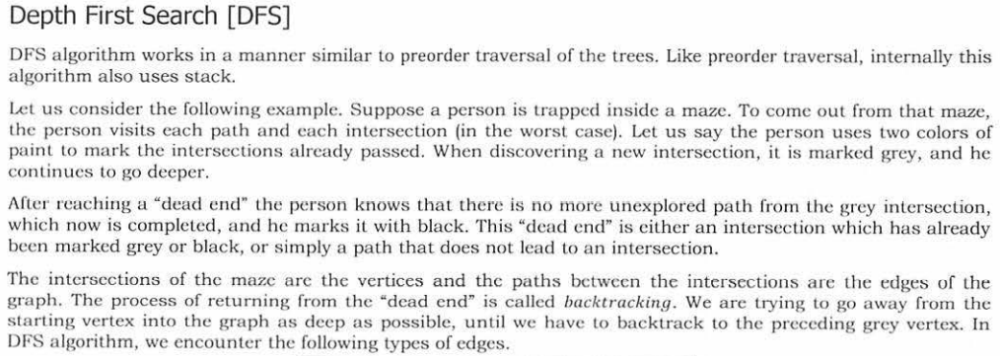

In [3]:
Image('dfs.png')

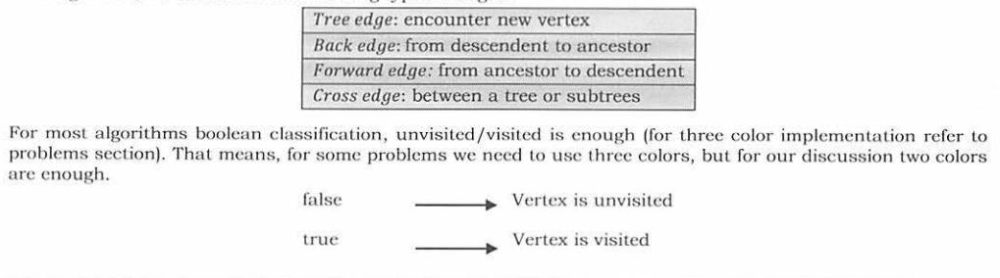

In [4]:
Image('dfs1.png')

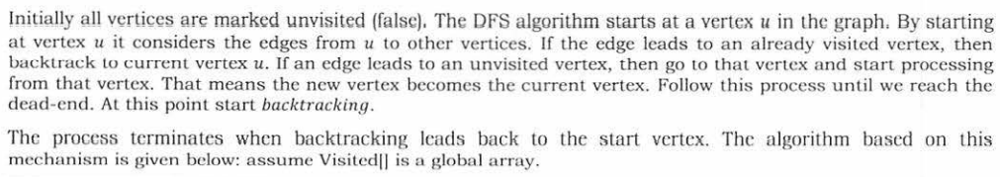

In [5]:
Image('dfs2.png')

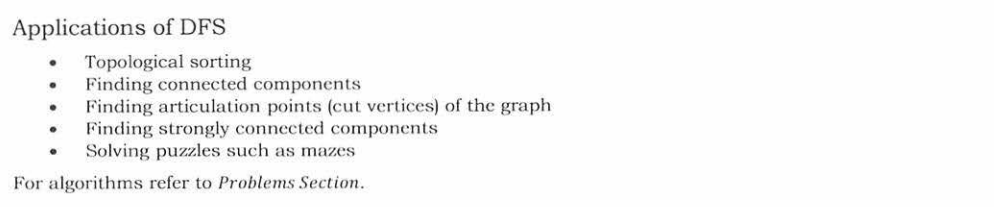

In [6]:
Image('dfs3.png')

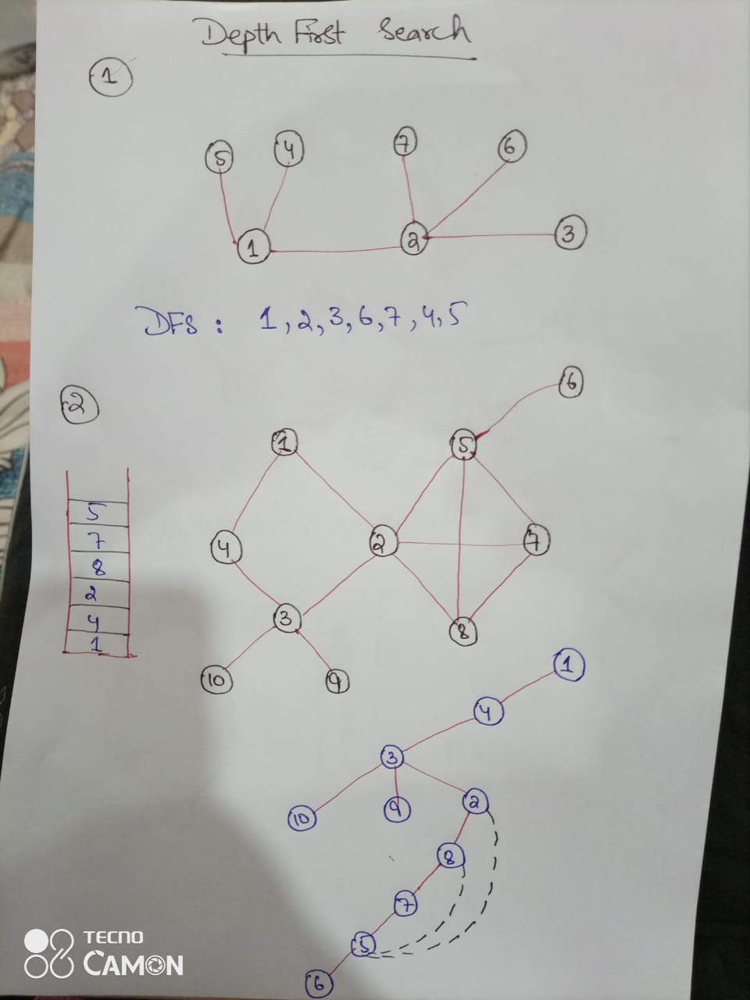

In [13]:
Image('dfs5.jpeg')

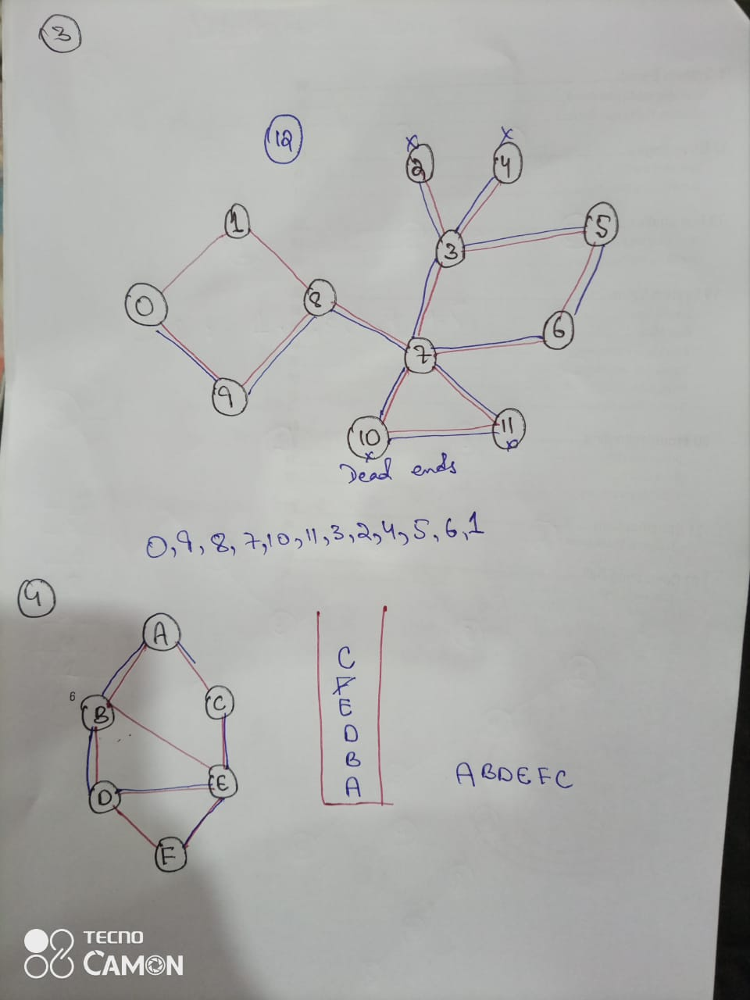

In [14]:
Image('dfs4.jpeg')

In [10]:
import sys
class Vertex:
    def __init__(self, node):
        self.id = node
        self.adjacent = {}
        # Set distance to infinity for all nodes
        self.distance = sys.maxsize
        # Mark all nodes unvisited        
        self.visited = False  
        # Predecessor
        self.previous = None

    def addNeighbor(self, neighbor, weight=0):
        self.adjacent[neighbor] = weight

    def getConnections(self):
        return self.adjacent.keys()  

    def getVertexID(self):
        return self.id

    def getWeight(self, neighbor):
        return self.adjacent[neighbor]

    def setDistance(self, dist):
        self.distance = dist

    def getDistance(self):
        return self.distance

    def setPrevious(self, prev):
        self.previous = prev

    def setVisited(self):
        self.visited = True

    def __str__(self):
        return str(self.id) + ' adjacent: ' + str([x.id for x in self.adjacent])

class Graph:
    def __init__(self):
        self.vertDictionary = {}
        self.numVertices = 0

    def __iter__(self):
        return iter(self.vertDictionary.values())

    def addVertex(self, node):
        self.numVertices = self.numVertices + 1
        newVertex = Vertex(node)
        self.vertDictionary[node] = newVertex
        return newVertex

    def getVertex(self, n):
        if n in self.vertDictionary:
            return self.vertDictionary[n]
        else:
            return None

    def addEdge(self, frm, to, cost=0):
        if frm not in self.vertDictionary:
            self.addVertex(frm)
        if to not in self.vertDictionary:
            self.addVertex(to)

        self.vertDictionary[frm].addNeighbor(self.vertDictionary[to], cost)
	# For directed graph do not add this
        self.vertDictionary[to].addNeighbor(self.vertDictionary[frm], cost)

    def getVertices(self):
        return self.vertDictionary.keys()

    def setPrevious(self, current):
        self.previous = current

    def getPrevious(self, current):
        return self.previous
	
    def getEdges(self):
        edges = []
        for currentVert in G:
            for nbr in currentVert.getConnections():
                currentVertID = currentVert.getVertexID()
                nbrID = nbr.getVertexID()
                edges.append((currentVertID, nbrID, currentVert.getWeight(nbr)))
        return edges

def dfs(G, currentVert, visited):
    visited[currentVert] = True  # mark the visited node 
    print("traversal: " + currentVert.getVertexID())
    for nbr in currentVert.getConnections():  # take a neighbouring node 
        if nbr not in visited:  # condition to check whether the neighbour node is already visited
            dfs(G, nbr, visited)  # recursively traverse the neighbouring node 
 
def DFSTraversal(G):
    visited = {}  # Dictionary to mark the visited nodes 
    for currentVert in G:  # G contains vertex objects
        if currentVert not in visited:  # Start traversing from the root node only if its not visited 
            dfs(G, currentVert, visited)  # For a connected graph this is called only once 

if __name__ == '__main__':

    G = Graph()
    G.addVertex('a')
    G.addVertex('b')
    G.addVertex('c')
    G.addVertex('d')
    G.addVertex('e')
    G.addVertex('f')
    G.addEdge('a', 'b', 1)  
    G.addEdge('a', 'c', 1)
    G.addEdge('b', 'd', 1)
    G.addEdge('b', 'e', 1)
    G.addEdge('c', 'd', 1)
    G.addEdge('c', 'e', 1)
    G.addEdge('d', 'e', 1)
    G.addEdge('e', 'a', 1)
    print('Graph data:')
    print(G.getEdges())
 
    DFSTraversal(G)

Graph data:
[('a', 'b', 1), ('a', 'c', 1), ('a', 'e', 1), ('b', 'a', 1), ('b', 'd', 1), ('b', 'e', 1), ('c', 'a', 1), ('c', 'd', 1), ('c', 'e', 1), ('d', 'b', 1), ('d', 'c', 1), ('d', 'e', 1), ('e', 'b', 1), ('e', 'c', 1), ('e', 'd', 1), ('e', 'a', 1)]
traversal: a
traversal: b
traversal: d
traversal: c
traversal: e
traversal: f


# BellmanFord Algorithm

In [4]:
from IPython.display import Image

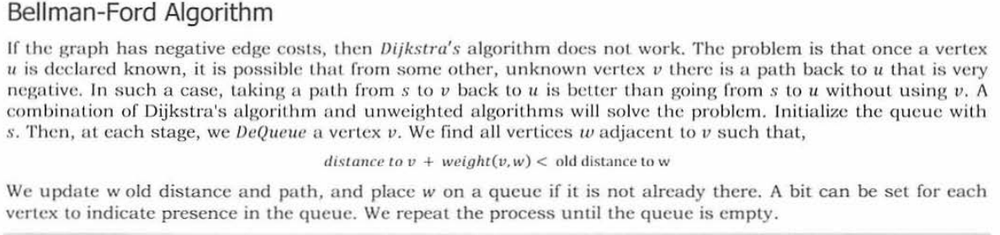

In [5]:
Image('bellman.png')

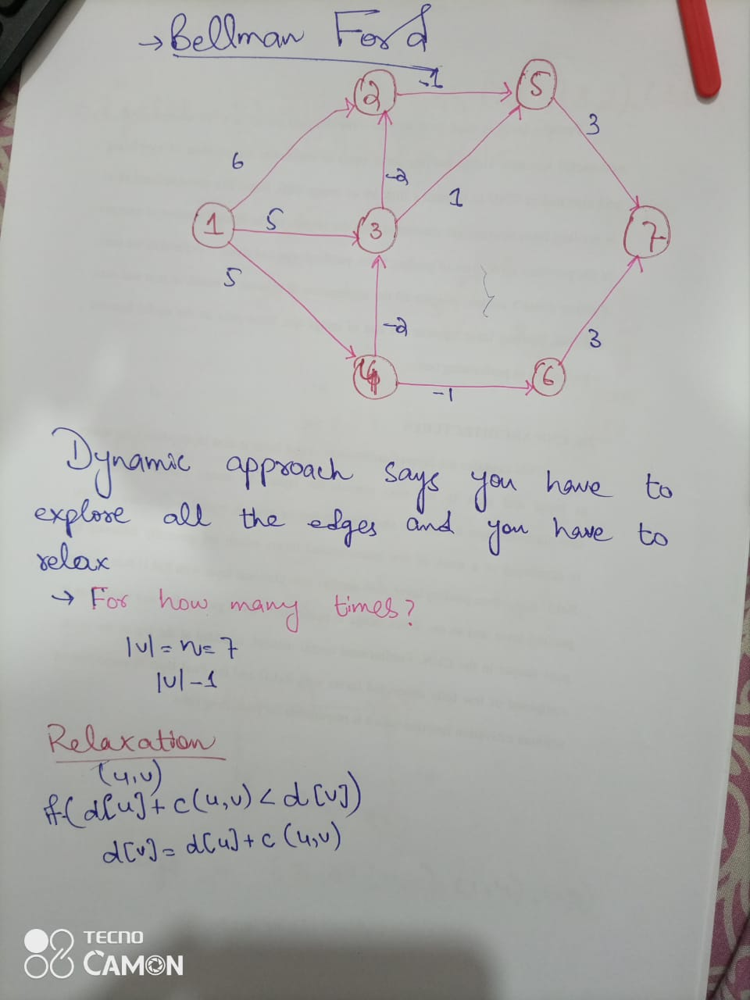

In [6]:
Image('bell2.jpeg')

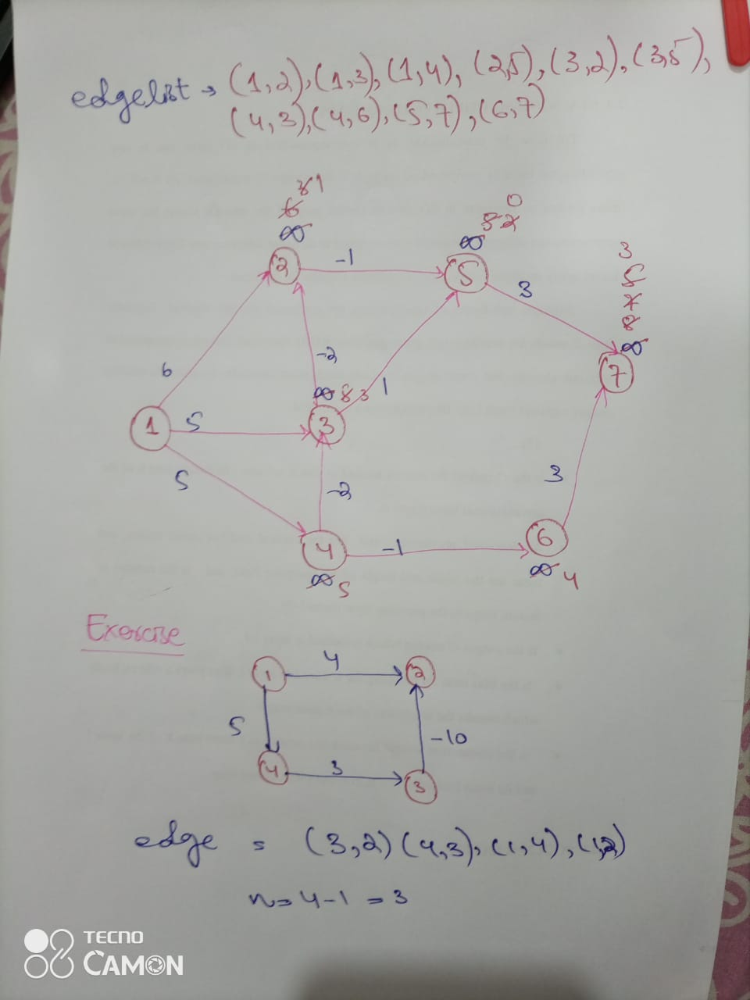

In [7]:
Image('bell1.jpeg')

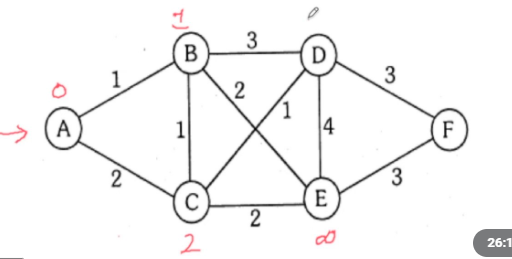

In [8]:
Image('bell3.png')

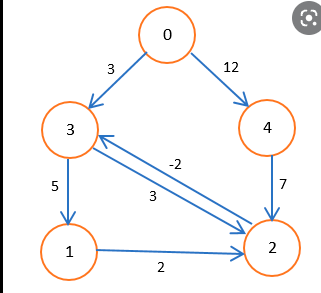

In [9]:
Image('bell4.png')

In [3]:
import sys
def BellmanFord(G, source):
    destination = {} 
    predecessor = {} 
    for node in G:
        destination[node] = sys.maxsize  # We start admiting that the rest of nodes are very very far
        predecessor[node] = None
    destination[source] = 0  # For the source we know how to reach
    for i in range(len(G) - 1): 
        for u in G:
            for v in G[u]:  # For each neighbour of u
		# If the distance between the node and the neighbour is lower than the one I have now
                if destination[v] > destination[u] + G[u][v]:
			# Record this lower distance
                    destination[v] = destination[u] + G[u][v]
                    predecessor[v] = u		
 
    # Step 3: check for negative-weight cycles
    for u in G:
        for v in G[u]:
            assert destination[v] <= destination[u] + G[u][v]
 
    return destination, predecessor	
    
if __name__ == '__main__':
	G = {
		'A': {'B':-1, 'C':  4},
		'B': {'C':  3, 'D':  2, 'E':  2},
		'C': {},
		'D': {'B':  1, 'C':  5},
		'E': {'D':-3}
	}
	print(BellmanFord(G, 'A'))

({'A': 0, 'B': -1, 'C': 2, 'D': -2, 'E': 1}, {'A': None, 'B': 'A', 'C': 'B', 'D': 'E', 'E': 'B'})


# Prim’s Minimum Spanning Tree (MST) | Greedy Algo

 Prim’s algorithm is a Greedy algorithm. It starts with an empty spanning tree. The idea is to maintain two sets of vertices. The first set contains the vertices already included in the MST, the other set contains the vertices not yet included. At every step, it considers all the edges that connect the two sets, and picks the minimum weight edge from these edges. After picking the edge, it moves the other endpoint of the edge to the set containing MST. 
A group of edges that connects two set of vertices in a graph is called cut in graph theory. So, at every step of Prim’s algorithm, we find a cut (of two sets, one contains the vertices already included in MST and other contains rest of the vertices), pick the minimum weight edge from the cut and include this vertex to MST Set (the set that contains already included vertices).

<b>How does Prim’s Algorithm Work?</b> The idea behind Prim’s algorithm is simple, a spanning tree means all vertices must be connected. So the two disjoint subsets (discussed above) of vertices must be connected to make a Spanning Tree. And they must be connected with the minimum weight edge to make it a Minimum Spanning Tree.

#### Algorithm 
1) Create a set mstSet that keeps track of vertices already included in MST. <br>
2) Assign a key value to all vertices in the input graph. Initialize all key values as INFINITE. Assign key value as 0 for the first vertex so that it is picked first. <br>
3) While mstSet doesn’t include all vertices <br>
3. (a) Pick a vertex u which is not there in mstSet and has minimum key value. <br>
3. (b) Include u to mstSet. <br>
3. (c) Update key value of all adjacent vertices of u. To update the key values, iterate through all adjacent vertices. For every adjacent vertex v, if weight of edge u-v is less than the previous key value of v, update the key value as weight of u-v<br>
The idea of using key values is to pick the minimum weight edge from cut. The key values are used only for vertices which are not yet included in MST, the key value for these vertices indicate the minimum weight edges connecting them to the set of vertices included in MST. 

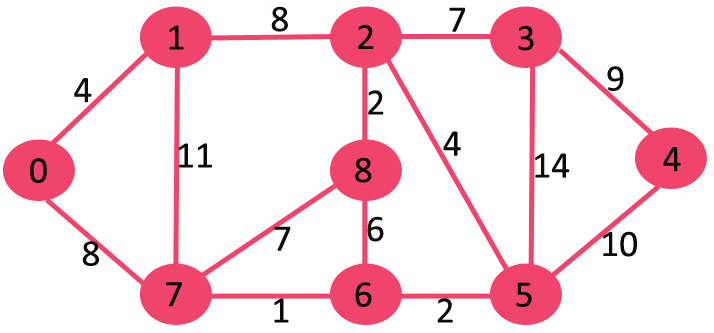

In [23]:
Image('prims.jpg')

The set mstSet is initially empty and keys assigned to vertices are {0, INF, INF, INF, INF, INF, INF, INF} where INF indicates infinite. Now pick the vertex with the minimum key value. The vertex 0 is picked, include it in mstSet. So mstSet becomes {0}. After including to mstSet, update key values of adjacent vertices. Adjacent vertices of 0 are 1 and 7. The key values of 1 and 7 are updated as 4 and 8. Following subgraph shows vertices and their key values, only the vertices with finite key values are shown. The vertices included in MST are shown in green color.

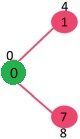

In [24]:
Image('prims1.jpg')

Pick the vertex with minimum key value and not already included in MST (not in mstSET). The vertex 1 is picked and added to mstSet. So mstSet now becomes {0, 1}. Update the key values of adjacent vertices of 1. The key value of vertex 2 becomes 8.

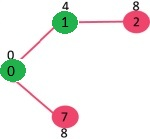

In [26]:
Image('prims2.jpg')

Pick the vertex with minimum key value and not already included in MST (not in mstSET). We can either pick vertex 7 or vertex 2, let vertex 7 is picked. So mstSet now becomes {0, 1, 7}. Update the key values of adjacent vertices of 7. The key value of vertex 6 and 8 becomes finite (1 and 7 respectively). 

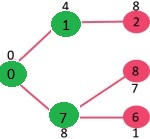

In [27]:
Image('prims3.jpg')

Pick the vertex with minimum key value and not already included in MST (not in mstSET). Vertex 6 is picked. So mstSet now becomes {0, 1, 7, 6}. Update the key values of adjacent vertices of 6. The key value of vertex 5 and 8 are updated.

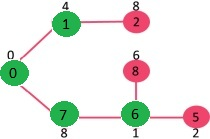

In [28]:
Image('prims4.jpg')

We repeat the above steps until mstSet includes all vertices of given graph. Finally, we get the following graph.

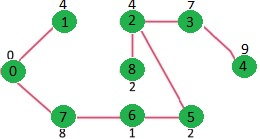

In [29]:
Image('prims5.jpg')

In [5]:
import sys # Library for INT_MAX
 
class Graph():
 
    def __init__(self, vertices):
        self.V = vertices
        self.graph = [[0 for column in range(vertices)]
                    for row in range(vertices)]
 
    # A utility function to print the constructed MST stored in parent[]
    def printMST(self, parent):
        print("Edge \tWeight")
        for i in range(1, self.V):
            print(parent[i], "-", i, "\t", self.graph[i][ parent[i] ])
 
    # A utility function to find the vertex with
    # minimum distance value, from the set of vertices
    # not yet included in shortest path tree
    def minKey(self, key, mstSet):
 
        # Initialize min value
        min = sys.maxsize
 
        for v in range(self.V):
            if key[v] < min and mstSet[v] == False:
                min = key[v]
                min_index = v
 
        return min_index
 
    # Function to construct and print MST for a graph
    # represented using adjacency matrix representation
    def primMST(self):
 
        # Key values used to pick minimum weight edge in cut
        key = [sys.maxsize] * self.V
        parent = [None] * self.V # Array to store constructed MST
        # Make key 0 so that this vertex is picked as first vertex
        key[0] = 0
        mstSet = [False] * self.V
 
        parent[0] = -1 # First node is always the root of
 
        for cout in range(self.V):
 
            # Pick the minimum distance vertex from
            # the set of vertices not yet processed.
            # u is always equal to src in first iteration
            u = self.minKey(key, mstSet)
 
            # Put the minimum distance vertex in
            # the shortest path tree
            mstSet[u] = True
 
            # Update dist value of the adjacent vertices
            # of the picked vertex only if the current
            # distance is greater than new distance and
            # the vertex in not in the shortest path tree
            for v in range(self.V):
 
                # graph[u][v] is non zero only for adjacent vertices of m
                # mstSet[v] is false for vertices not yet included in MST
                # Update the key only if graph[u][v] is smaller than key[v]
                if self.graph[u][v] > 0 and mstSet[v] == False and key[v] > self.graph[u][v]:
                        key[v] = self.graph[u][v]
                        parent[v] = u
 
        self.printMST(parent)
 
g = Graph(5)
g.graph = [ [0, 2, 0, 6, 0],
            [2, 0, 3, 8, 5],
            [0, 3, 0, 0, 7],
            [6, 8, 0, 0, 9],
            [0, 5, 7, 9, 0]]
 
g.primMST();

Edge 	Weight
0 - 1 	 2
1 - 2 	 3
0 - 3 	 6
1 - 4 	 5


# Kruskal’s Minimum Spanning Tree Algorithm  (Greedy Algo)

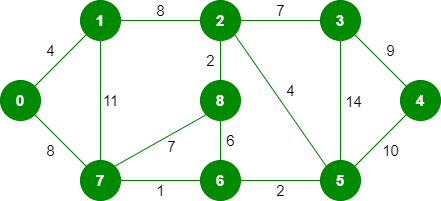

In [14]:
Image('kruskal1.png')

The graph contains 9 vertices and 14 edges. So, the minimum spanning tree formed will be having (9 – 1) = 8 edges. 

Now pick all edges one by one from the sorted list of edges 
1. Pick edge 7-6: No cycle is formed, include it. 

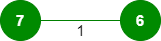

In [15]:
Image('kruskal2.png')

2. Pick edge 8-2: No cycle is formed, include it. 

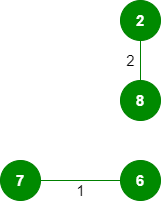

In [16]:
Image('kruskal3.png')

3. Pick edge 6-5: No cycle is formed, include it.

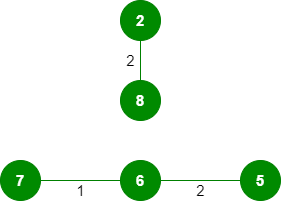

In [17]:
Image('kruskal4.png')

4. Pick edge 0-1: No cycle is formed, include it.

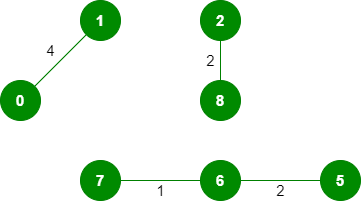

In [18]:
Image('kruskal5.png')

5. Pick edge 2-5: No cycle is formed, include it. 

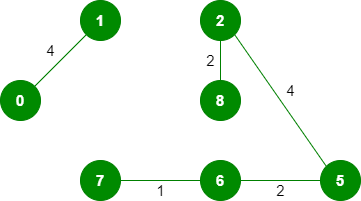

In [19]:
Image('kruskal6.png')

6. Pick edge 8-6: Since including this edge results in the cycle, discard it.
7. Pick edge 2-3: No cycle is formed, include it. 

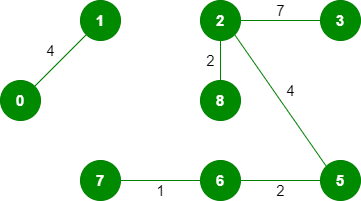

In [20]:
Image('kruskal7.png')

8. Pick edge 7-8: Since including this edge results in the cycle, discard it.
9. Pick edge 0-7: No cycle is formed, include it. 

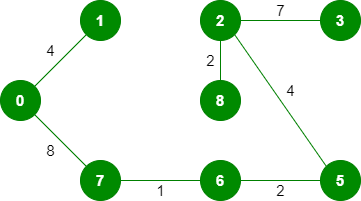

In [21]:
Image('kruskal8.png')

10. Pick edge 1-2: Since including this edge results in the cycle, discard it.
11. Pick edge 3-4: No cycle is formed, include it. 

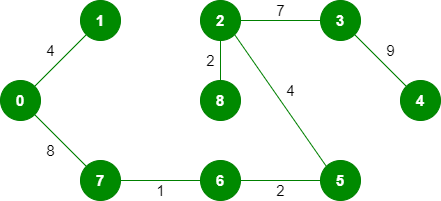

In [22]:
Image('kruskal9.png')

Since the number of edges included equals (V – 1), the algorithm stops here.

In [11]:

from collections import defaultdict
 
# Class to represent a graph
 
 
class Graph:
 
    def __init__(self, vertices):
        self.V = vertices  # No. of vertices
        self.graph = []  # default dictionary
        # to store graph
 
    # function to add an edge to graph
    def addEdge(self, u, v, w):
        self.graph.append([u, v, w])
 
    # A utility function to find set of an element i
    # (uses path compression technique)
    def find(self, parent, i):
        if parent[i] == i:
            return i
        return self.find(parent, parent[i])
 
    # A function that does union of two sets of x and y
    # (uses union by rank)
    def union(self, parent, rank, x, y):
        xroot = self.find(parent, x)
        yroot = self.find(parent, y)
 
        # Attach smaller rank tree under root of
        # high rank tree (Union by Rank)
        if rank[xroot] < rank[yroot]:
            parent[xroot] = yroot
        elif rank[xroot] > rank[yroot]:
            parent[yroot] = xroot
 
        # If ranks are same, then make one as root
        # and increment its rank by one
        else:
            parent[yroot] = xroot
            rank[xroot] += 1
 
    # The main function to construct MST using Kruskal's
        # algorithm
    def KruskalMST(self):
 
        result = []  # This will store the resultant MST
         
        # An index variable, used for sorted edges
        i = 0
         
        # An index variable, used for result[]
        e = 0
 
        # Step 1:  Sort all the edges in
        # non-decreasing order of their
        # weight.  If we are not allowed to change the
        # given graph, we can create a copy of graph
        self.graph = sorted(self.graph,
                            key=lambda item: item[2])
 
        parent = []
        rank = []
 
        # Create V subsets with single elements
        for node in range(self.V):
            parent.append(node)
            rank.append(0)
 
        # Number of edges to be taken is equal to V-1
        while e < self.V - 1:
 
            # Step 2: Pick the smallest edge and increment
            # the index for next iteration
            u, v, w = self.graph[i]
            i = i + 1
            x = self.find(parent, u)
            y = self.find(parent, v)
 
            # If including this edge does't
            #  cause cycle, include it in result
            #  and increment the indexof result
            # for next edge
            if x != y:
                e = e + 1
                result.append([u, v, w])
                self.union(parent, rank, x, y)
            # Else discard the edge
 
        minimumCost = 0
        print ("Edges in the constructed MST")
        for u, v, weight in result:
            minimumCost += weight
            print("%d -- %d == %d" % (u, v, weight))
        print("Minimum Spanning Tree" , minimumCost)
 
# Driver code
g = Graph(4)
g.addEdge(0, 1, 10)
g.addEdge(0, 2, 6)
g.addEdge(0, 3, 5)
g.addEdge(1, 3, 15)
g.addEdge(2, 3, 4)
 
# Function call
g.KruskalMST()
 

Edges in the constructed MST
2 -- 3 == 4
0 -- 3 == 5
0 -- 1 == 10
Minimum Spanning Tree 19


# Topological Sort

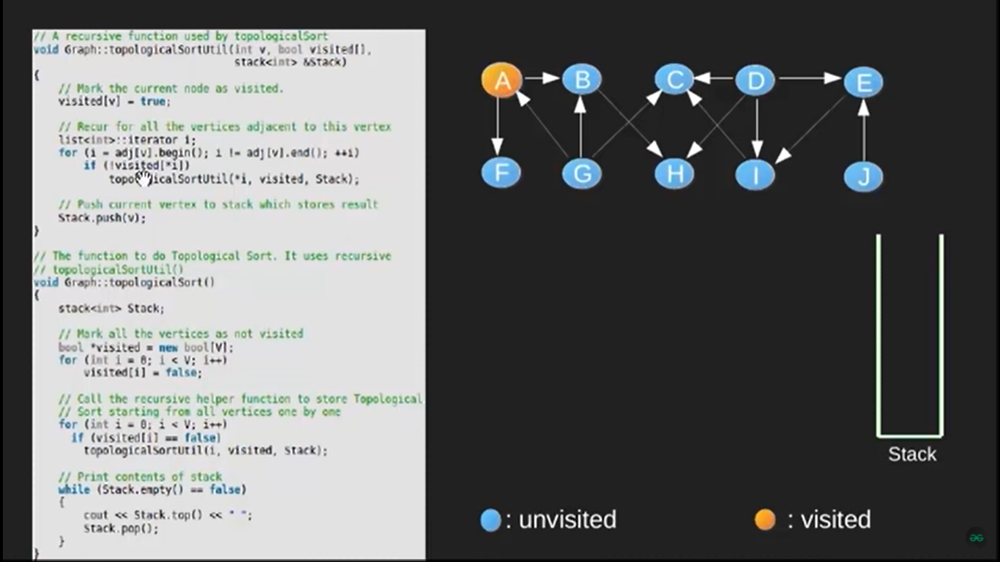

In [33]:
Image('Screenshot (41).png')

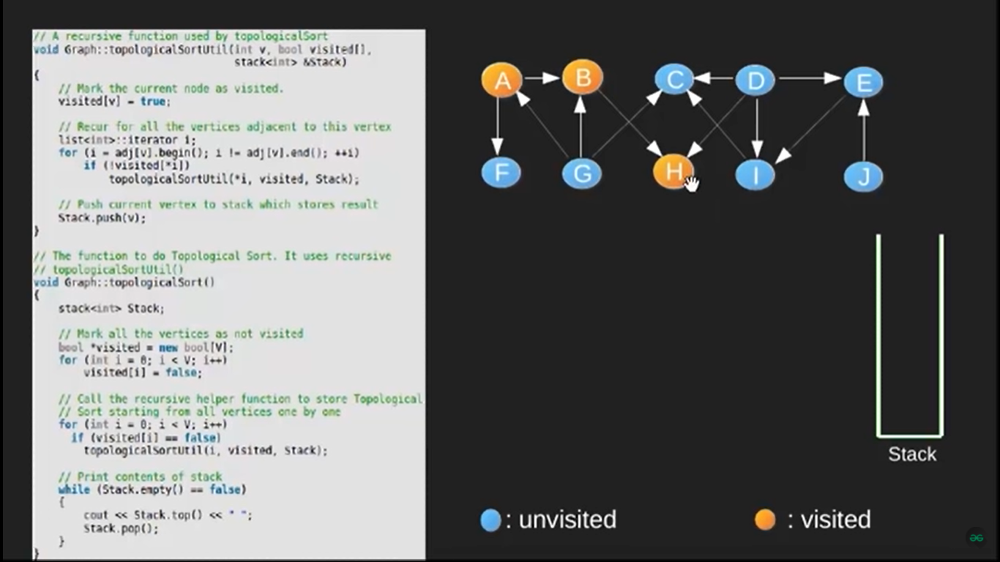

In [34]:
Image('Screenshot (42).png')

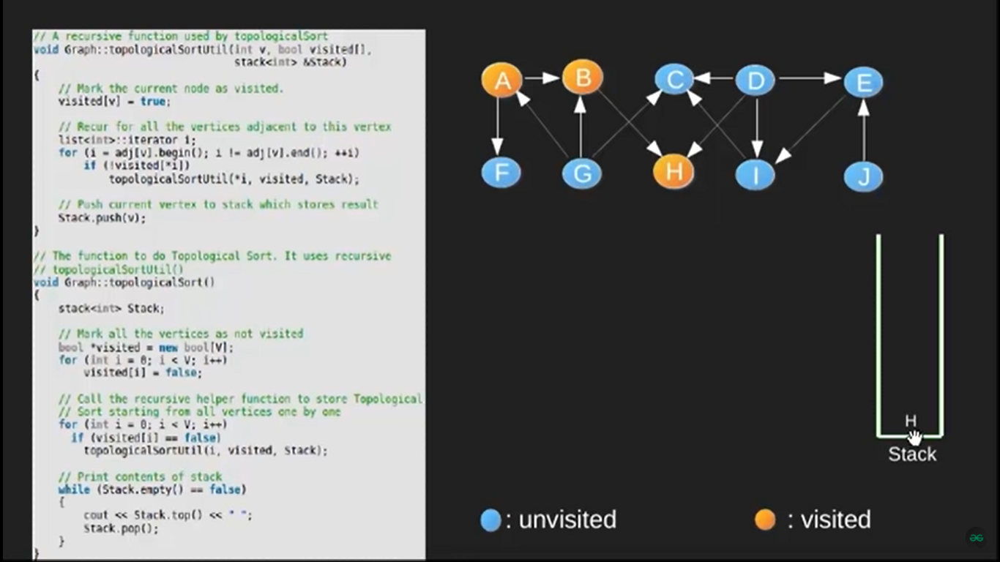

In [35]:
Image('Screenshot (43).png')

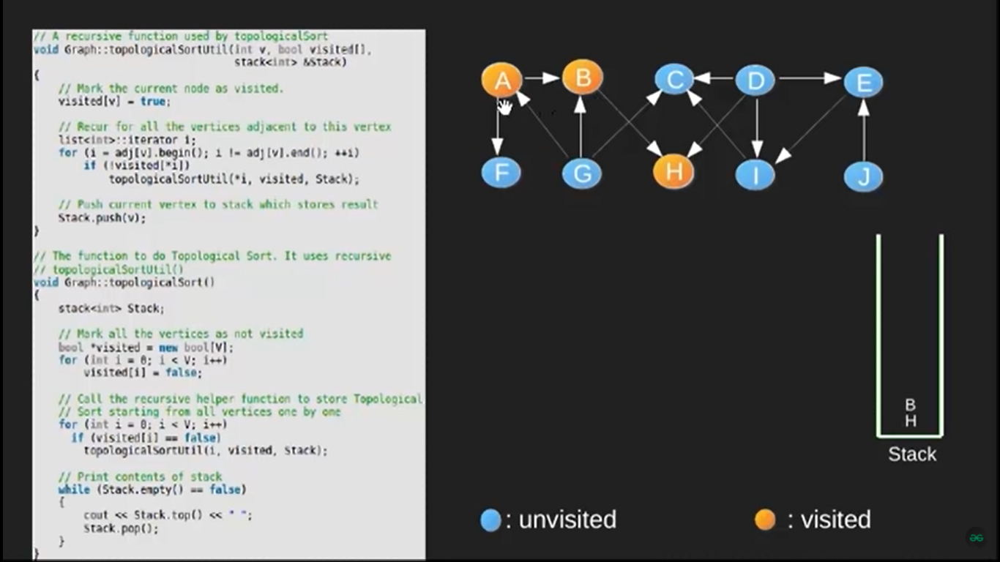

In [36]:
Image('Screenshot (44).png')

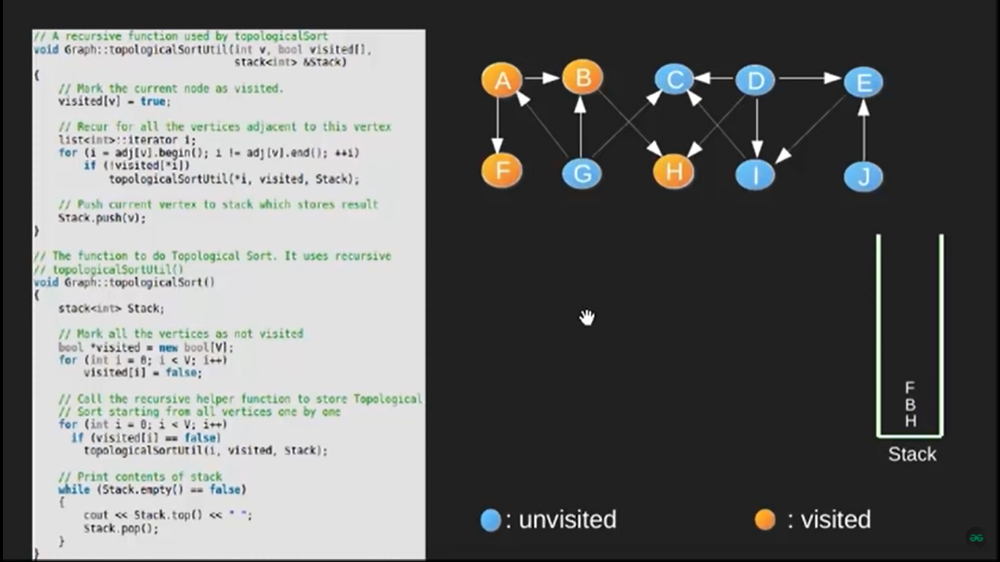

In [37]:
Image('Screenshot (45).png')

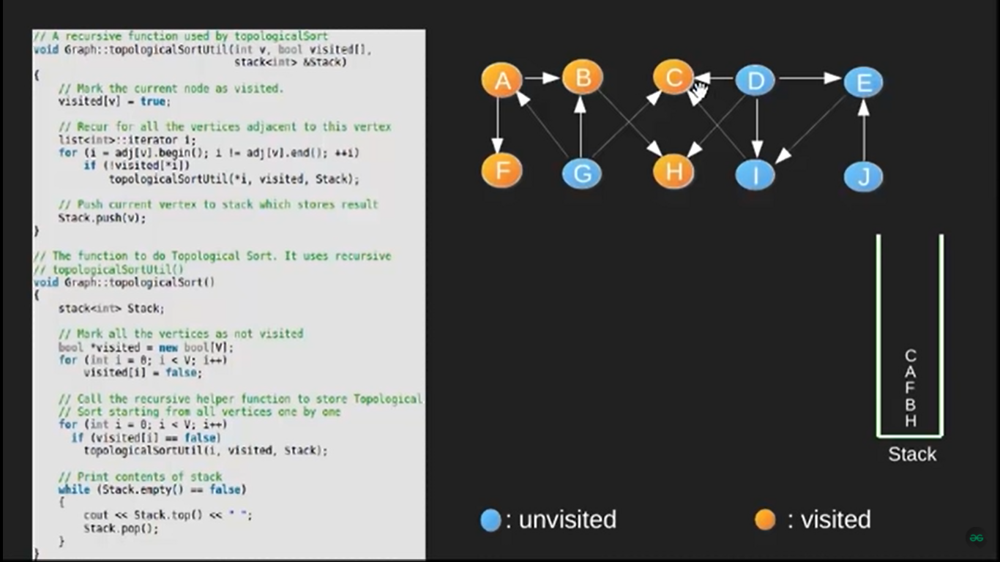

In [38]:
Image('Screenshot (46).png')

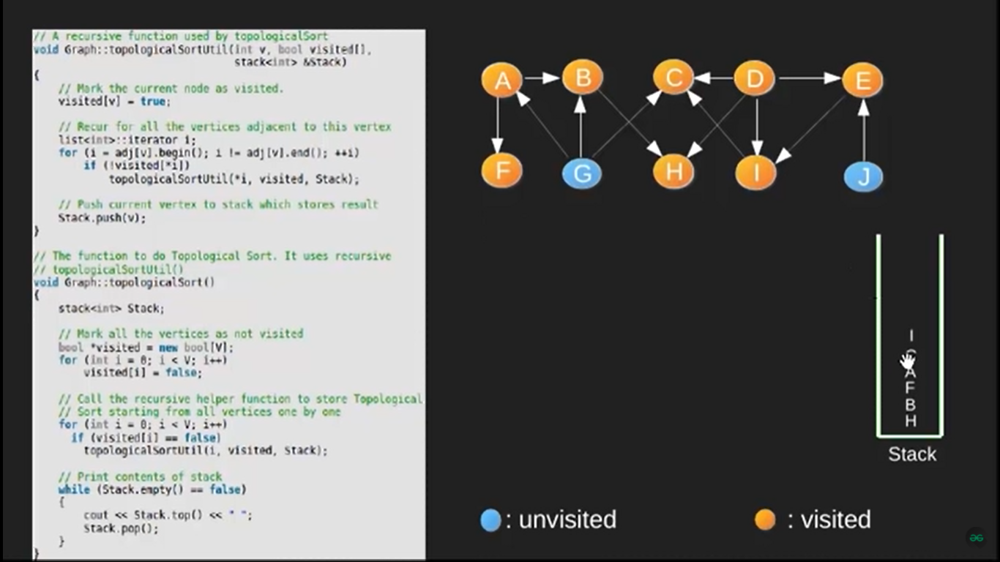

In [39]:
Image('Screenshot (47).png')

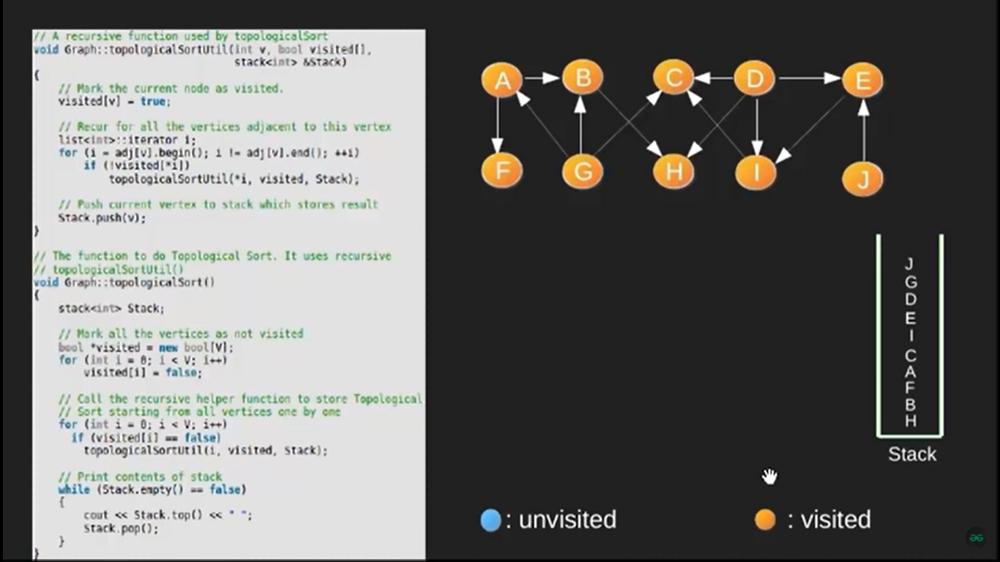

In [41]:
Image('Screenshot (49).png')

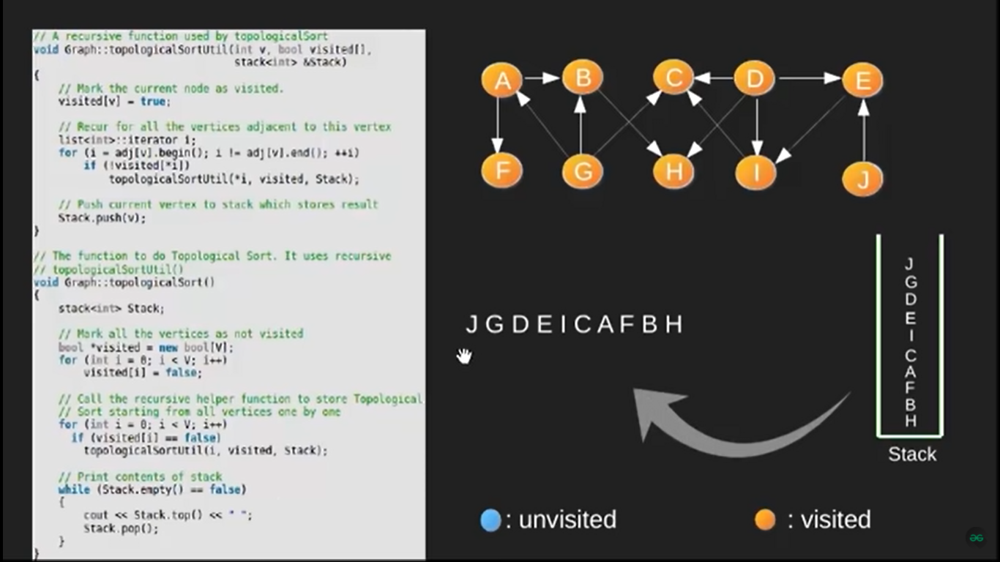

In [42]:
Image('Screenshot (50).png')

In [31]:
from collections import defaultdict
 
#Class to represent a graph
class Graph:
    def __init__(self,vertices):
        self.graph = defaultdict(list) #dictionary containing adjacency List
        self.V = vertices #No. of vertices
 
    # function to add an edge to graph
    def addEdge(self,u,v):
        self.graph[u].append(v)
 
    # A recursive function used by topologicalSort
    def topologicalSortUtil(self,v,visited,stack):
 
        # Mark the current node as visited.
        visited[v] = True
 
        # Recur for all the vertices adjacent to this vertex
        for i in self.graph[v]:
            if visited[i] == False:
                self.topologicalSortUtil(i,visited,stack)
 
        # Push current vertex to stack which stores result
        stack.insert(0,v)
 
    # The function to do Topological Sort. It uses recursive
    # topologicalSortUtil()
    def topologicalSort(self):
        # Mark all the vertices as not visited
        visited = [False]*self.V
        stack =[]
 
        # Call the recursive helper function to store Topological
        # Sort starting from all vertices one by one
        for i in range(self.V):
            if visited[i] == False:
                self.topologicalSortUtil(i,visited,stack)
 
        # Print contents of stack
        print(stack)
 
g= Graph(6)
g.addEdge(5, 3);
g.addEdge(5, 0);
g.addEdge(4, 0);
g.addEdge(4, 1);
g.addEdge(2, 3);
g.addEdge(3, 1);
 
print("Following is a Topological Sort of the given graph")
g.topologicalSort()

Following is a Topological Sort of the given graph
[5, 4, 2, 3, 1, 0]
